In [1]:
import numpy as np
import pandas as pd

def benchmark(x1, x2):
    return (    (1.3356 * (1.5 * (1 - x1))) 
                + (np.exp((2 * x1) - 1) * np.sin((3 * np.pi) * ((x1 - 0.6) ** 2)))
                + (np.exp(3 * (x2 - 0.5)) * np.sin((4 * np.pi) * ((x2 - 0.9) ** 2)))
            )

def getData(grid):
    x1 = np.linspace(0, 1, grid)
    x2 = np.linspace(0, 1, grid)
    x1, x2 = np.meshgrid(x1, x2)
    f_x1_x2 = benchmark(x1, x2)
    data = {'x1': x1.flatten(), 'x2': x2.flatten(), 'f(x1,x2)': f_x1_x2.flatten()}
    df = pd.DataFrame(data)
    return df


df_1000 = getData(32)
df_test = pd.read_excel("./Kriging-data.xlsx", sheet_name="Test")
df_training = pd.read_excel("./Kriging-data.xlsx", sheet_name="Training")

/tmp/ipykernel_7369/3481449524.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


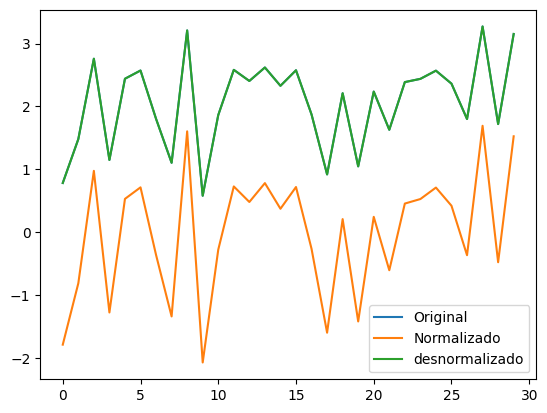

In [2]:
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

scaler = StandardScaler()
out_scaler = StandardScaler()

def test_out_scaler(df):
    out = df["f(x1,x2)"].values.reshape(-1, 1)  
    plt.plot(out, label='Original')
    out_scaler.fit(out)
    norm = out_scaler.transform(out)
    plt.plot(norm, label='Normalizado')
    plt.plot(out_scaler.inverse_transform(norm), label='desnormalizado')
    plt.legend()
    plt.show()

scaler.fit(np.hstack((df_training['x1'].values.reshape(-1, 1),
                       df_training['x2'].values.reshape(-1, 1))))

test_out_scaler(df_training)

In [3]:
import pandas as pd
variograms =  ["Exponential", "Gaussian", "HoleEffect", "Linear", "Original", "Power", "Spherical"]

def SumarizeForNewData():
    df = {"metric": ["r2", "mse", "mape", "rmse"]}
    for variogram in variograms:
        path = f"./{variogram}/results/results.xlsx"
        data = pd.read_excel(path, sheet_name="metrics")
        df[variogram] = data["media"]
    return pd.DataFrame(df)

def SumarizeTrainingMean():
    df = {}
    for variogram in variograms:
        path = f"./{variogram}/results/better_results.xlsx"
        data = pd.read_excel(path)
        data = data.drop(data.columns[-1], axis=1)
        mean_values = data.iloc[:, 2:].mean()
        df[variogram] = mean_values       
    return pd.DataFrame(df)

def SumarizeTraining(sort_by):
    df_dict = {}

    for variogram in variograms:
        path = f"./{variogram}/results/better_results.xlsx"
        data = pd.read_excel(path, index_col=None)
        
        data = data.sort_values(by=sort_by, ascending=True)
        df_dict[variogram] = data.iloc[0]
    
    df = pd.DataFrame(df_dict)
    df = df.iloc[1:]
    return df

def SumarizeForNewDataModel(models):
    df = {"metric": ["r2", "mse", "mape", "rmse"]}
    for variogram, model in zip(variograms, models):
        path = f"./{variogram}/results/results.xlsx"
        data = pd.read_excel(path, sheet_name="metrics")
        df[variogram] = data["media"]
    return pd.DataFrame(df)


# Médias das métricas de treinamento


In [4]:
display(SumarizeTrainingMean())

,Exponential,Gaussian,HoleEffect,Linear,Original,Power,Spherical
r2,0.951514,0.960209,0.952666,0.582843,0.970288,0.781947,0.960605
r2_sup,0.616783,0.675067,0.605849,-0.536867,0.468233,0.098525,0.648119
r2_test,0.609183,0.622123,0.595325,-0.308930,0.695041,0.168093,0.640352
r2_val,0.943147,0.956333,0.947465,0.081505,0.939858,0.662287,0.953698
mse,0.015401,0.017048,0.015713,0.049225,0.015193,0.033947,0.014830
mse_sup,0.227494,0.192894,0.233985,0.912351,0.315680,0.535155,0.208892
mse_test,0.273776,0.264711,0.283483,0.916933,0.213630,0.582768,0.251941
mse_val,0.017247,0.017976,0.016776,0.075438,0.021444,0.047730,0.015714
mape,0.038915,0.037504,0.037602,0.073983,0.029539,0.065808,0.035061
rmse,0.089303,0.077686,0.085133,0.203086,0.070430,0.169629,0.075778


# Métricas de treinamento para o melhor modelo (ordenado por mse_sup)

In [5]:
df = SumarizeTraining(sort_by="mse_sup")
display(df)

,Exponential,Gaussian,HoleEffect,Linear,Original,Power,Spherical
model,model_1_16_7,model_1_42_6,model_1_19_5,model_7_1_3,model_2_49_7,model_6_22_7,model_2_40_7
r2,0.910787,0.935743,0.898243,0.360303,0.999515,0.700237,0.987662
r2_sup,0.707327,0.794004,0.709169,0.276485,0.962215,0.554157,0.72432
r2_test,0.675291,0.820777,0.736521,0.478715,0.996318,0.648715,0.740785
r2_val,0.781745,0.875214,0.848416,0.572173,0.999666,0.428009,0.99007
mse,0.028337,0.027531,0.03378,0.075485,0.000248,0.046668,0.004645
mse_sup,0.173744,0.122288,0.17265,0.42951,0.022431,0.264672,0.163655
mse_test,0.227465,0.125549,0.184572,0.365171,0.00258,0.246082,0.181586
mse_val,0.048141,0.053242,0.060174,0.065335,0.000122,0.045699,0.00401
mape,0.077703,0.068542,0.078013,0.109825,0.003445,0.09121,0.028836


# Métricas de treinamento para o melhor modelo (ordenado por mse_test)

In [6]:
df = SumarizeTraining(sort_by="mse_test")
display(df)

,Exponential,Gaussian,HoleEffect,Linear,Original,Power,Spherical
model,model_8_8_7,model_1_45_9,model_5_22_9,model_7_1_3,model_2_48_7,model_2_47_5,model_4_0_3
r2,0.99511,0.938421,0.997139,0.360303,0.999428,0.751976,0.499362
r2_sup,0.631796,0.793195,0.582488,0.276485,0.96107,0.51962,0.496551
r2_test,0.769033,0.827642,0.741723,0.478715,0.996466,0.680024,0.785589
r2_val,0.984035,0.91625,0.997959,0.572173,0.999729,0.468614,-0.527751
mse,0.001553,0.026383,0.00095,0.075485,0.000292,0.038613,0.188464
mse_sup,0.218582,0.122769,0.247853,0.42951,0.023111,0.285174,0.298869
mse_test,0.161798,0.12074,0.180928,0.365171,0.002476,0.22415,0.1502
mse_val,0.006058,0.027351,0.000762,0.065335,0.000068,0.028666,0.34391
mape,0.012026,0.068823,0.011227,0.109825,0.003573,0.081513,0.158966


In [7]:
import numpy as np
import plotly.offline as py
import plotly.graph_objs as go
import plotly.figure_factory as ff
from scipy.spatial import Delaunay

def PlotSurface(X, Y, Z, model_name, mesh_x=80, mesh_y=100):
    x_sup, y_sup, z_sup = df_1000['x1'], df_1000['x2'], df_1000['f(x1,x2)']
    x_orig, y_orig, z_orig = df_training['x1'], df_training['x2'], df_training['f(x1,x2)']
    x_test, y_test, z_test = df_test['x1'], df_test['x2'], df_test['f(x1,x2)']


    points = np.column_stack((x_sup, y_sup))
    tri = Delaunay(points)

    # Criar a superfície original
    fig_surface = ff.create_trisurf(x=x_sup, y=y_sup, z=z_sup, simplices=tri.simplices, colormap='Greys')

    # Criar a superfície virtual
    virtual_surface = go.Surface(
        x=X.reshape(mesh_x, mesh_y),
        y=Y.reshape(mesh_x, mesh_y),
        z=Z,
        colorscale="matter_r",
        showscale=False,
        contours=dict(
            z=dict(
                show=True,
                start=np.min(Z),
                end=np.max(Z),
                size=0.05,
                usecolormap=True,
                project_z=True
            )
        )
    )
    fig = go.Figure()

    fig.add_trace(go.Scatter3d(x=x_orig, y=y_orig, z=z_orig, mode='markers',
                               marker=dict(size=5, color='red', opacity=0.8),
                               name='Training Samples', showlegend = True))
    
    fig.add_trace(go.Scatter3d(x=x_test, y=y_test, z=z_test,
                               mode='markers',
                               marker=dict(size=5, color='blue', opacity=0.8),
                               name='Test Samples', showlegend = True))

    fig.add_trace(fig_surface.data[0])

    fig.add_trace(virtual_surface)
    fig.update_layout(
        title=f'Surface fit for {model_name} variogram',
        scene=dict(
            xaxis_title='x1',
            yaxis_title='x2',
            zaxis_title='f(x1, x2)',
            aspectmode='cube',
            xaxis = dict(backgroundcolor = "white"),
            yaxis = dict(backgroundcolor = "white"),
            zaxis = dict(backgroundcolor = "white"),
        )
    )
    py.iplot(fig)

In [8]:
import os

os.chdir("./content")

lm_dir = "tf-levenberg-marquardt"
if not os.path.exists(lm_dir):
  !git clone https://github.com/fabiodimarco/$lm_dir

os.chdir(lm_dir)

In [9]:
import tensorflow as tf
import numpy as np
from keras import regularizers
from keras import initializers
import levenberg_marquardt as lm

# layers, neurons
class ShuffleArchitecture:
    def __init__(self, input_size, hidden_sizes, output_size, act_h, act_o, param_reg):
        self.input_size = input_size
        self.hidden_sizes = hidden_sizes
        self.output_size = output_size
        self.act_h = act_h
        self.act_o = act_o
        self.regularizer = regularizers.L2(param_reg)
        self.initializer = initializers.RandomUniform(minval=-0.5, maxval=0.5, seed=np.random.randint(1, 10000))

    def compute_k(self):
        total_parameters = 0
        for layer in self.model.layers:
            weights = layer.get_weights()
            if len(weights) > 0:  
                for w in weights:
                    total_parameters += np.prod(w.shape)
        return total_parameters
        
    def set_architecture(self):
        self.model = tf.keras.Sequential()
        self.model.add(tf.keras.layers.Dense(self.hidden_sizes[0],
                        input_shape=(self.input_size,),
                        activation=self.act_h,
                        kernel_regularizer=self.regularizer,
                        kernel_initializer=self.initializer,                        
                        ))  # input layer

        for size in self.hidden_sizes[1:]:  # hidden layers
            self.model.add(tf.keras.layers.Dense(size,
                            activation=self.act_h,
                            kernel_regularizer=self.regularizer,
                            kernel_initializer=self.initializer,  
                        ))

        self.model.add(tf.keras.layers.Dense(self.output_size,
                        activation=self.act_o,
                        kernel_regularizer=self.regularizer,
                        kernel_initializer=self.initializer,  
                        ))  # output layer

    def create_model(self, _learning_rate):
        self.model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
            loss=tf.keras.losses.MeanSquaredError())

        self.lm_model = lm.ModelWrapper(
            tf.keras.models.clone_model(self.model))

        self.lm_model.compile(
            optimizer=tf.keras.optimizers.SGD(learning_rate=_learning_rate),
            loss=lm.MeanSquaredError())
        return(self.lm_model)

2024-09-16 11:03:43.607226: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-16 11:03:43.607282: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-16 11:03:43.608326: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-09-16 11:03:43.615506: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-09-16 11:03:44.733318: W tensorflow/compiler/tf2

In [17]:
import pickle
import numpy as np

class Rebuild:
    def __init__(self, df):
        self.df = df 

    def LoadModelWeights(self, model, fileName):        
        file = f"{self.path}/models/{fileName}.keras"
        model.load_weights(file)

    def LoadPrevDataset(self, fileName):
        fileName = fileName.replace("model", "dataset")
        pos = fileName.rfind("_")
        file = f"{self.path}/dataset/{fileName[:pos]}.pkl" 
        with open(file, 'rb') as f:
            _data, _train, _val, _test = pickle.load(f)
        self._data, self._train, self._val, self._test = _data, _train, _val, _test    
    
    def setArchitecture(self, _hidden_sizes, _pg, _lr):
        shuffler = ShuffleArchitecture(input_size  = 2,
                                        hidden_sizes = _hidden_sizes,
                                        output_size = 1,
                                        act_h = 'tanh',
                                        act_o = 'linear',
                                        param_reg=_pg)
        shuffler.set_architecture()
        self.k = shuffler.compute_k()
        return(shuffler.create_model(_lr))            

    def getArchitecture(self, architecture):
        hidden_size = [int(x) for x in architecture.split("[")[1].split("]")[0].split(", ")]
        regularizer = float(architecture.split("regularizer=")[1].split(",")[0])
        learning_rate = float(architecture.split("learning_rate=")[1])
        return hidden_size, regularizer, learning_rate   
    
    def predictUnsampled(self, model, mesh_x=80, mesh_y=100):
        Z = np.zeros((mesh_x, mesh_y))
        dx, dy = 1 / mesh_y, 1 / mesh_x

        X = np.zeros(mesh_x * mesh_y)
        Y = np.zeros(mesh_x * mesh_y)
        
        points = np.zeros((mesh_x * mesh_y, 2))
        
        for i in range(mesh_x):
            for j in range(mesh_y):
                idx = i * mesh_y + j
                X[idx] = dx * j
                Y[idx] = dy * i
                points[idx] = [X[idx], Y[idx]]

        points = scaler.transform(points)
        Z_flat = model.predict(points)
        Z_flat = out_scaler.inverse_transform(Z_flat)

        Z = Z_flat.reshape((mesh_x, mesh_y))

        return X, Y, Z

    def rebuildFullNet(self):
        for file_model, architecture, variogram in zip(self.df["model"], self.df["Architecture"], self.df.index):
            print(file_model, architecture, variogram)
            self.path = f'../../{variogram}/content'
            hidden_size, regularizer, learning_rate = self.getArchitecture(architecture)
            self.lm_model = self.setArchitecture(hidden_size, regularizer, learning_rate)
            self.LoadModelWeights(self.lm_model, file_model)
            self.LoadPrevDataset(file_model)
            X, Y, Z = self.predictUnsampled(self.lm_model)
            PlotSurface(X, Y, Z, variogram)

In [18]:
Rebuilder = Rebuild(df.T)
Rebuilder.rebuildFullNet()

model_8_8_7 Hidden Size=[12, 6], regularizer=0.02, learning_rate=0.01 Exponential
250/250 [==============================] - 1s 4ms/step


model_1_45_9 Hidden Size=[4], regularizer=0.02, learning_rate=0.01 Gaussian
250/250 [==============================] - 1s 2ms/step


model_5_22_9 Hidden Size=[36], regularizer=0.02, learning_rate=0.01 HoleEffect
250/250 [==============================] - 0s 2ms/step


model_7_1_3 Hidden Size=[8, 4], regularizer=0.02, learning_rate=0.01 Linear
250/250 [==============================] - 1s 2ms/step


model_2_48_7 Hidden Size=[8], regularizer=0.02, learning_rate=0.01 Original
250/250 [==============================] - 1s 4ms/step


model_2_47_5 Hidden Size=[8], regularizer=0.02, learning_rate=0.01 Power
250/250 [==============================] - 1s 6ms/step


model_4_0_3 Hidden Size=[24], regularizer=0.02, learning_rate=0.01 Spherical
250/250 [==============================] - 1s 4ms/step
